In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import seaborn as sns
import pandas as pd
import matplotlib.colors as mcolors
from PIL import Image, ImageOps
from statistics import median
import matplotlib.patheffects as pe
import os

mercury: -5.38km to 4.48km above average = 9.9km difference
venus: -2.9km to 10.8km above average= 13.7km difference
earth: -11 to 8.8km above sea level = 19.8 km difference
mars: -8.2km to 21.2km above datum = 29.4 difference 

-11 to 21.2 = 32.2km range
255 bins
1 bin = 0.126 km = 126m

mercury = 79 bins, from 44 to 123, 255/79 = 3.2
venus = 108 bins, from 64 to 172
eartch = 157 bins from 0 to 157
mars = 233 bins, from 22 to 255

-11 to 21 = 32

In [31]:
bin_to_km = 32.2/255

In [8]:
plt.style.use('bmh')
def plot_hist_map(img_path, clist, bin_start, bin_end, mm,save=True):
    img = Image.open(img_path)
    img = ImageOps.grayscale(img)
    ratio = img.size[0]/img.size[1]
    img = img.resize((1024,int(1024/ratio)))
    img = np.asarray(img)
    bin_counts, bin_edges = np.histogram(img, bins=255, range=(0,255))
    df = pd.DataFrame(bin_counts,index=bin_edges[0:-1],columns=["value"])
    
    new_bins = bin_end - bin_start
    every_n = 255/new_bins
    df = df.groupby(np.arange(len(df))//every_n).mean() # scale bins
    df = df.reindex(range(256)) # add empty indecies so next part doesn't remove data
    df = df.shift(periods=bin_start, fill_value=0).fillna(0) # shift data down
    
    cmap_original = mcolors.LinearSegmentedColormap.from_list("", clist)

    clist = [((c[0]/every_n)+(bin_start/255), c[1]) for c in clist] # scale color list
    clist.append((1,"white"))
    clist.append((0,"black"))
    clist.sort()
    
    cmap_scaled = mcolors.LinearSegmentedColormap.from_list("", clist)
    
    plt.figure(figsize=(12.80,4.80))
    
    plt.axes().set_facecolor("lightgrey")
    plt.gca().get_yaxis().set_visible(False)
    #plt.box(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)
    plt.gca().spines['bottom'].set_visible(True)
    plt.bar(x=df.index, height=df.value, width=1, color=cmap_scaled(df.index/255.))
    
    plt.xlim(-15,265)
    
    num_of_neg_ticks = 6
    num_of_pos_ticks = 11
    ticklist = np.concatenate((np.arange(0, 86, 86//(num_of_neg_ticks-1))[:-1], np.arange(86, 272, (256-86)//(num_of_pos_ticks-1))))
    plt.gca().xaxis.set_ticks(ticklist)
    
    labels = [*np.linspace(start=-11000, stop=0, num=num_of_neg_ticks).astype(int)[:-1], 
              *np.linspace(start=0, stop=21200, num=num_of_pos_ticks).astype(int)]
    labels = [str(x)+"\n"+str(int(x*3.28084)) for x in labels]
    plt.gca().set_xticklabels(labels, fontsize = 12) 
    
    label = plt.gca().set_xlabel('m\nft', ha='center', va = 'top', )#fontsize = 9)
    ticklab = plt.gca().xaxis.get_ticklabels()[0]
    trans = ticklab.get_transform()
    plt.gca().xaxis.set_label_coords(-15, 0, transform=trans)
    
    plt.annotate("Lowest\npoint", fontsize=13,
                 xy=(bin_start, 100), 
                 xytext=(bin_start, plt.gca().get_ylim()[1]*0.25), 
                 arrowprops=dict(facecolor='black', shrink=0.05,width=2,headwidth=9),
                horizontalalignment='center', verticalalignment='top')    
    plt.annotate("Highest\npoint", fontsize=13,
                 xy=(bin_end, 100), 
                 xytext=(bin_end, plt.gca().get_ylim()[1]*0.25), 
                 arrowprops=dict(facecolor='black', shrink=0.05,width=2,headwidth=9),
                horizontalalignment='center', verticalalignment='top')

    save_path = img_path.split(".")[0] + "_hist.png"
    plt.tight_layout()
    if save:
        i=1
        while os.path.isfile(save_path):
            save_path = img_path.split(".")[0] + f"_hist{i}.png"
            i+=1
        plt.savefig(save_path,dpi=100)
    plt.show()

    plt.figure(figsize=(12.80,7.20))
    min_point_x, min_point_y, max_point_x, max_point_y = mm[0][0],mm[0][1],mm[1][0],mm[1][1]
    
    plt.annotate("Lowest point", 
                 xy=(min_point_x,min_point_y), 
                 xytext=(min_point_x,min_point_y+50), 
                 arrowprops=dict(facecolor='white', edgecolor="k",shrink=0.05,width=4,headwidth=16,lw=1.5),
                horizontalalignment='center', verticalalignment='top',
                color="white",fontsize=18,path_effects=[pe.withStroke(linewidth=3, foreground="k")]) 
    plt.annotate("Highest point", 
                 xy=(max_point_x,max_point_y), 
                 xytext=((max_point_x if max_point_x<950 else max_point_x-30),max_point_y-70), 
                 arrowprops=dict(facecolor='white', edgecolor="k",shrink=0.05,width=4,headwidth=16,lw=1.5),
                horizontalalignment='center', verticalalignment='top',
                color="white",fontsize=18,path_effects=[pe.withStroke(linewidth=3, foreground="k")]) 
    plt.axis('off')
    save_path = img_path.split(".")[0] + "_map.png"
    plt.imshow(cmap_original(img))
    plt.tight_layout()
    if save:
        i=1
        while os.path.isfile(save_path):
            save_path = img_path.split(".")[0] + f"_map{i}.png"
            i+=1
        plt.savefig(save_path,dpi=100)


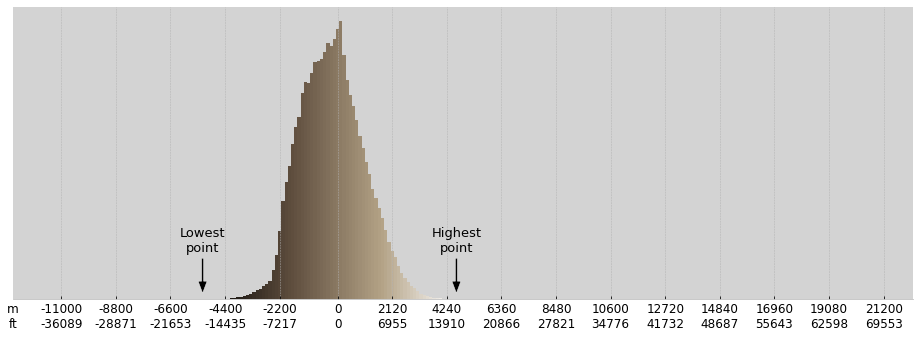

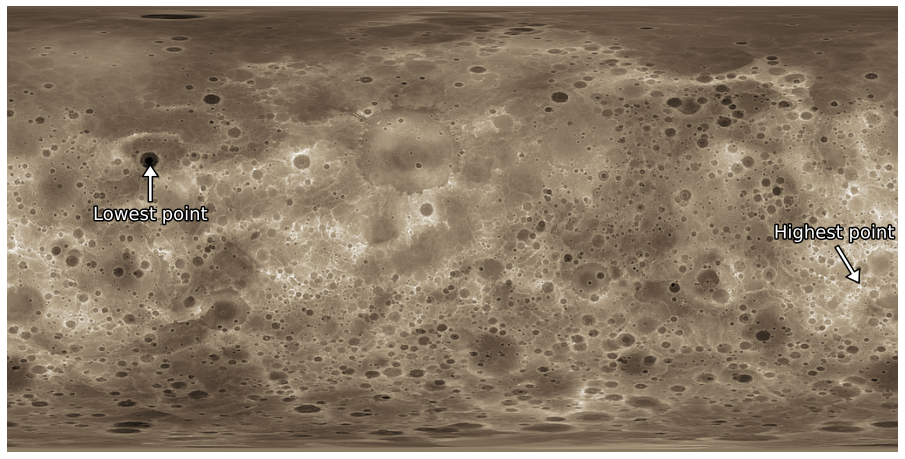

In [136]:
#plt.style.use('default')
#plt.style.use('bmh')
clist = [(0, "black"),  (90/255, "#5F4E3E"), (180/255, "#B3A286"), (255/255, "white")] #MERCURY
minmax_coords = [(164,179),(980,320)]
plot_hist_map("mercury.jpg", clist, 44, 123, minmax_coords)

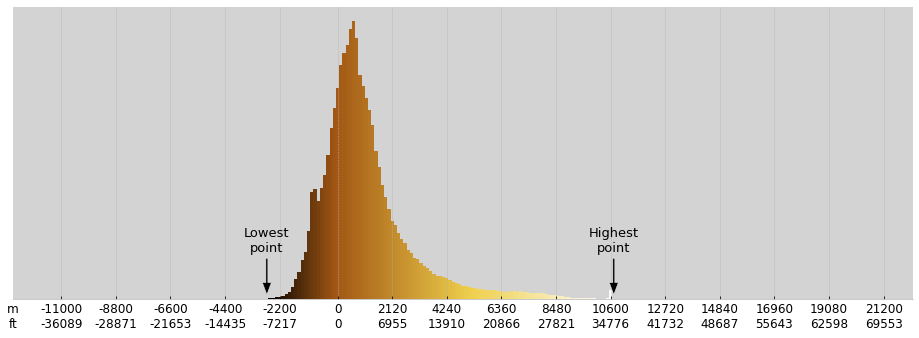

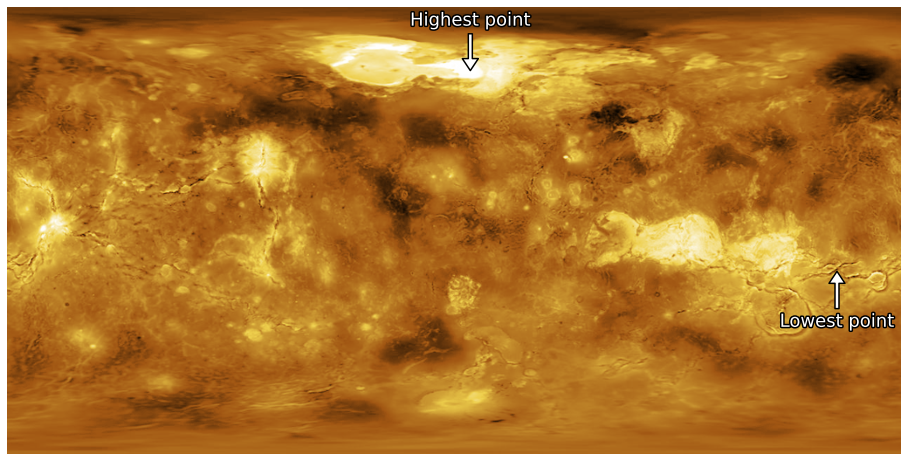

In [137]:
#plt.style.use('fivethirtyeight')
clist = [(0, "black"),  (50/255, "#A15613"), (150/255, "#EECF4C"), (255/255, "white")] #VENUS
minmax_coords = [(950,300),(530,75)]
plot_hist_map("venus3.png", clist, 64, 172, minmax_coords)

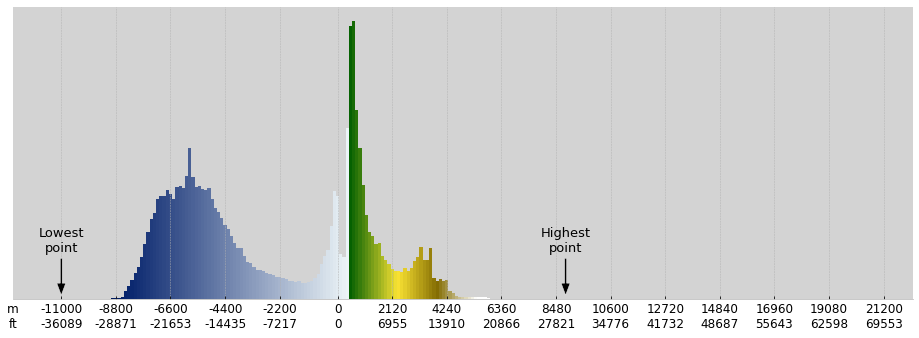

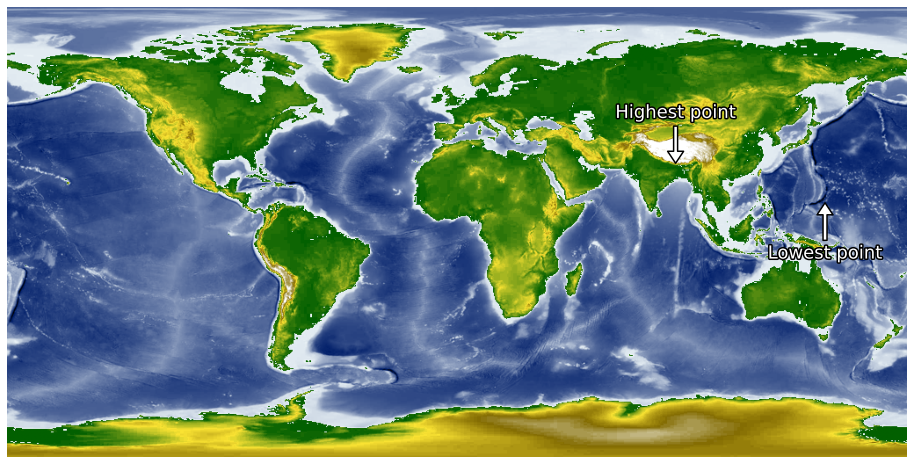

In [138]:
#plt.style.use('ggplot')
clist = [(0, "black"), (30/255., "#001E69"),(145/255., "#EDF5F8"),(146/255., "#036001"), 
         (170/255., "#FAE333") ,(190/255., "#846D03"),(210/255., "white"), (255/255., "white")] # EARTH
minmax_coords = [(930,220),(760,180)]
plot_hist_map("earth.jpg", clist, 0, 157,minmax_coords)

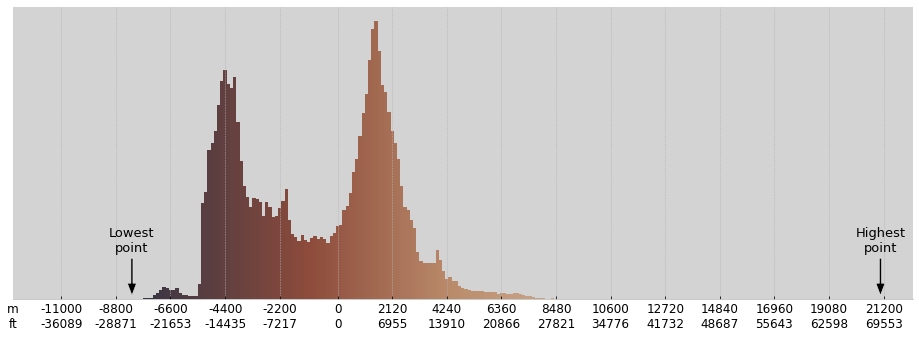

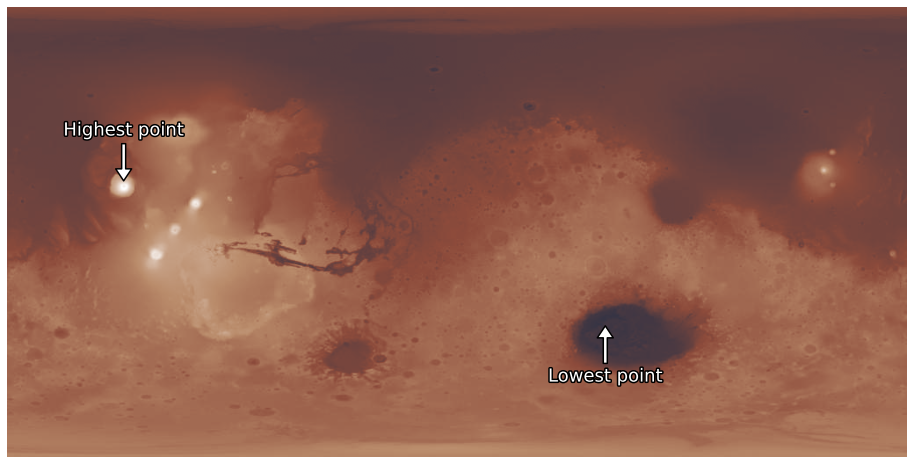

In [9]:
#plt.style.use('default')
clist = [(0, "#313345"), (60/255., "#8D4B3B"), (110/255., "#BA8C6B"), (255/255., "white")] # MARS
minmax_coords = [(680,360),(132,200)]

plot_hist_map("mars.jpg", clist,22, 255,minmax_coords)

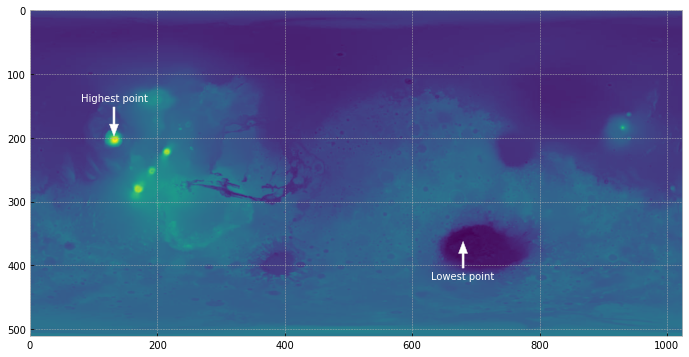

In [89]:
img = Image.open("mars.jpg")
img = ImageOps.grayscale(img)
ratio = img.size[0]/img.size[1]
img = img.resize((1024,int(1024/ratio)))
img = np.asarray(img)
plt.figure(figsize=(20,6))
min_point_x, min_point_y = 680,360
max_point_x, max_point_y = 132,200
plt.annotate("Lowest point", 
             xy=(min_point_x,min_point_y), 
             xytext=(min_point_x,min_point_y+50), 
             arrowprops=dict(facecolor='white', shrink=0.05,width=2,headwidth=9),
             color="white",
            horizontalalignment='center', verticalalignment='top') 
plt.annotate("Highest point", 
             xy=(max_point_x,max_point_y), 
             xytext=(max_point_x,max_point_y-70), 
             arrowprops=dict(facecolor='white', shrink=0.05,width=2,headwidth=9),
             color="white",
            horizontalalignment='center', verticalalignment='top') 
plt.imshow(img)

In [50]:
img = np.where(img<5,255,img)

In [51]:
np.argmin(np.where(img<1,255,img))//1024

10

In [52]:
(np.argmin(img)/1024 - np.argmin(img)//1024)*512

210.5

In [79]:
min_point_x = np.argmin(img)//img.shape[1]
min_point_y= np.argmin(img[min_point_x,:])
print(min_point_x,min_point_y)
print(img[min_point_x,min_point_y])

360 672
1


In [81]:
img = Image.open("mars.jpg")
img = ImageOps.grayscale(img)
print(img.size)
ratio = img.size[0]/img.size[1]
#img2 = img.resize((int(img.size[0]/2), int(img.size[1]/2)), resample=Image.BILINEAR)
print(img2.size)
img2 = np.asarray(img2)
print(img2.size)
plt.figure(figsize=(20,6))
#min_point_x, min_point_y = 164,179
min_point_x = (np.argmin(img2)//img2.shape[1])
min_point_y= np.argmin(img2[min_point_x,:])
max_point_x = (np.argmax(img2)//img2.shape[1])
max_point_y= np.argmax(img2[max_point_x,:])
print(min_point_x,min_point_y)
print(max_point_x,max_point_y)
print(img2[min_point_x,min_point_y])
print(img2[max_point_x,max_point_y])

(1024, 512)
131072
131072
88 81
107 484
2
237


<Figure size 1440x432 with 0 Axes>

In [188]:
np.argmax(img[374,:])

705

In [183]:
min_point_y = np.argmax(img)//img.shape[0]
min_point_x = (np.argmax(img)/img.shape[0] - np.argmax(img)//img.shape[0])*img.shape[1]
print(min_point_x,min_point_y)

568.0 374


In [190]:
img[374,705]

224

Text(84.99999999999858, 115.50000000000001, 'Lowest point')

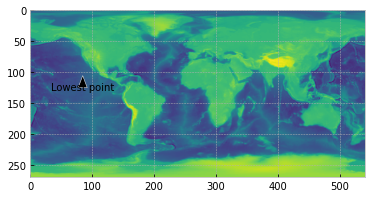

In [132]:
img = Image.open("earth.jpg")
img = img.resize((int(img.size[0]/4),int(img.size[1]/4)))
img = np.asarray(img)
plt.imshow(img)
plt.annotate("Lowest point", 
                 xy=(min_point_x,min_point_y), 
                 xytext=(min_point_x,min_point_y*1.1), 
                 arrowprops=dict(facecolor='black', shrink=0.05,width=2,headwidth=9),
                horizontalalignment='center', verticalalignment='top') 

In [190]:
min_point_y = np.argmin(img)//img.shape[0]
min_point_x = (np.argmin(img)/img.shape[0] - np.argmin(img)//img.shape[0])*img.shape[1]
print(min_point_x,min_point_y)

1886.0000000000582 495


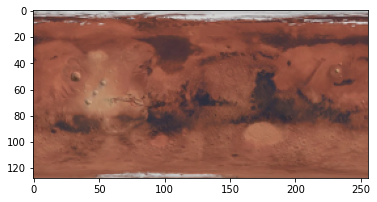

In [418]:
img_color = Image.open('mars_color.png')
img_color = img_color.resize((len(img[0]),len(img[:,0])))
img_color = np.asarray(img_color)
plt.imshow(img_color)


In [505]:
def color_from_heightmap(img, img_color):
    mapping = dict.fromkeys(list(range(0,256)))
    img_color_flat = img_color.flatten().reshape(len(img[0])*len(img[:,0]),4)
    for loc, i in enumerate(img.ravel()):
        if mapping[i] == None:
            mapping[i] = [img_color_flat[loc]]
        else:
            mapping[i].append(img_color_flat[loc])
            
    for j in mapping:
        if j==0:
            if ((mapping[j]!=None) and (len(mapping[j])>1)):
                mapping[j] = np.median(mapping[j],0)
            else:
                mapping[j] = [0,0,0,255]
            continue
            
        if (mapping[j]==None):
            mapping[j] = mapping[j-1]
            continue
            
        med = np.median(mapping[j],0)
        if np.all(med <= mapping[j-1]):
            mapping[j] = mapping[j-1]
        else:
            mapping[j] = med

        
    return mapping

In [506]:
%%time
mapping = color_from_heightmap(img[::], img_color[::])
mapping

Wall time: 289 ms


{0: [0, 0, 0, 255],
 1: [0, 0, 0, 255],
 2: [0, 0, 0, 255],
 3: [0, 0, 0, 255],
 4: array([178., 118.,  90., 255.]),
 5: array([179.5, 118.5,  91.5, 255. ]),
 6: array([179.5, 118.5,  91.5, 255. ]),
 7: array([179. , 119. ,  91.5, 255. ]),
 8: array([179. , 119. ,  91.5, 255. ]),
 9: array([179. , 119. ,  91.5, 255. ]),
 10: array([179. , 119. ,  91.5, 255. ]),
 11: array([179. , 119. ,  91.5, 255. ]),
 12: array([179. , 119. ,  91.5, 255. ]),
 13: array([179. , 119. ,  91.5, 255. ]),
 14: array([179. , 119. ,  91.5, 255. ]),
 15: array([179. , 119. ,  91.5, 255. ]),
 16: array([179. , 119. ,  91.5, 255. ]),
 17: array([179. , 119. ,  91.5, 255. ]),
 18: array([179. , 119. ,  91.5, 255. ]),
 19: array([179. , 119. ,  91.5, 255. ]),
 20: array([179. , 119. ,  91.5, 255. ]),
 21: array([179. , 119. ,  91.5, 255. ]),
 22: array([179. , 119. ,  91.5, 255. ]),
 23: array([179. , 119. ,  91.5, 255. ]),
 24: array([179. , 119. ,  91.5, 255. ]),
 25: array([179. , 119. ,  91.5, 255. ]),
 26: a

In [4]:
bin_counts, bin_edges = np.histogram(img, bins=255, range=(0,255))
df = pd.DataFrame(bin_counts,index=bin_edges[1:],columns=["value"])
df

,value
1.0,0
2.0,1
3.0,4
4.0,15
5.0,38
...,...
251.0,1
252.0,0
253.0,2
254.0,3


In [21]:
every_n = 255/233
df2 = df.groupby(np.arange(len(df))//every_n).mean()
df2

,value
0.0,0.5
1.0,4.0
2.0,15.0
3.0,38.0
4.0,68.0
...,...
228.0,1.0
229.0,0.0
230.0,2.0
231.0,3.0


In [22]:
df2 = df2.reindex(range(len(df2)+22))
df2.shift(periods=22, fill_value=0)

,value
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
250,1.0
251,0.0
252,2.0
253,3.0


In [ ]:
mars = 233 bins, from 22 to 255

<BarContainer object of 255 artists>

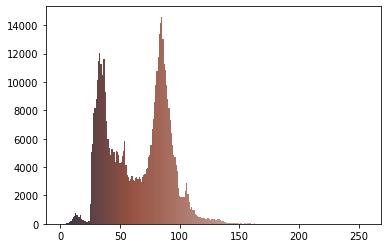

In [10]:
clist = [(0, "#313345"), (60/255., "#965242"), (255/255., "white")]
cmap = mcolors.LinearSegmentedColormap.from_list("", clist)
#cmap = mcolors.LinearSegmentedColormap.from_list("", cvalues.to_numpy()/255.)

plt.bar(x=df.index, height=df.value,width=1,color=cmap(df.index/255.)) #calculating histogra.

In [508]:
cvalues = pd.DataFrame(mapping).T.fillna(method="bfill")
cvalues

,0,1,2,3
0,0.0,0.0,0.0,255.0
1,0.0,0.0,0.0,255.0
2,0.0,0.0,0.0,255.0
3,0.0,0.0,0.0,255.0
4,178.0,118.0,90.0,255.0
...,...,...,...,...
251,206.0,165.0,134.0,255.0
252,206.0,165.0,134.0,255.0
253,206.0,165.0,134.0,255.0
254,206.0,165.0,134.0,255.0


<BarContainer object of 255 artists>

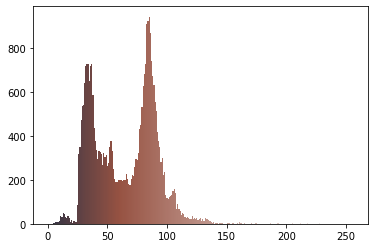

In [527]:
clist = [(0, "#313345"), (60/255., "#965242"), (255/255., "white")]
cmap = mcolors.LinearSegmentedColormap.from_list("", clist)
#cmap = mcolors.LinearSegmentedColormap.from_list("", cvalues.to_numpy()/255.)

plt.bar(x=df.index, height=df.value,width=1,color=cmap(df.index/255.)) #calculating histogra.

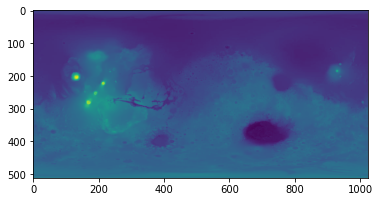

In [528]:
plt.imshow(img)

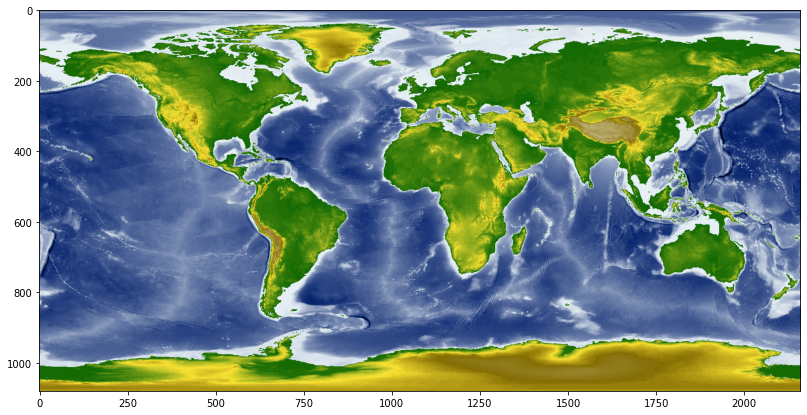

In [558]:
plt.figure(figsize=(25,7))
plt.imshow(cmap(img))

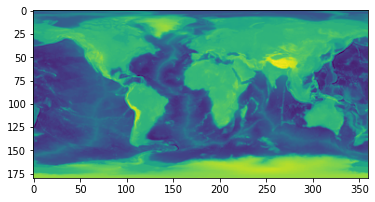

In [234]:
img = Image.open("earth.jpg")
img = img.resize((360,180))
img = np.asarray(img)
plt.imshow(img)

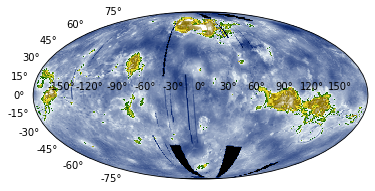

In [250]:
img = Image.open("venus.jpg")
img = img.resize((360,180))
img = np.asarray(img)

fig = plt.figure()
ax = fig.add_subplot(111, projection='mollweide')
#arr = np.random.rand(180, 360)

lon = np.linspace(-np.pi, np.pi,360)
lat = np.linspace(np.pi/2., -np.pi/2.,180)
Lon,Lat = np.meshgrid(lon,lat)

im = ax.pcolormesh(Lon,Lat,img, cmap=cmap)

plt.show()

In [240]:
bin_counts, bin_edges = np.histogram(img, bins=255, range=(0,255))
df = pd.DataFrame(bin_counts,index=bin_edges[0:-1],columns=["value"])
df

,value
0.0,0
1.0,0
2.0,0
3.0,0
4.0,0
...,...
250.0,0
251.0,0
252.0,0
253.0,0


In [75]:
bin_end = 175
bin_start = 0
new_bins = bin_end-bin_start
every_n = 255/new_bins
print(new_bins, every_n)



175 1.457142857142857


In [76]:
df = df.groupby(np.arange(len(df))//every_n).mean() # scale bins
df

,value
0.0,116.5
1.0,59.0
2.0,54.0
3.0,64.0
4.0,50.0
...,...
170.0,0.0
171.0,0.0
172.0,0.0
173.0,0.0


In [77]:
df = df.reindex(range(255)) # add empty indecies so next part doesn't remove data
df

,value
0,116.5
1,59.0
2,54.0
3,64.0
4,50.0
...,...
250,NaN
251,NaN
252,NaN
253,NaN


In [78]:
df = df.shift(periods=bin_start, fill_value=0).fillna(0)
df

,value
0,116.5
1,59.0
2,54.0
3,64.0
4,50.0
...,...
250,0.0
251,0.0
252,0.0
253,0.0


<BarContainer object of 255 artists>

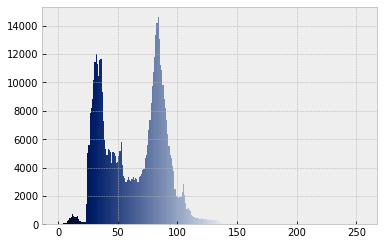

In [179]:
clist = [(0, "black"), (30/255., "#001E69"),(143/255., "#EDF5F8"),(144/255., "#036001"), 
         (170/255., "#FAE333") ,(190/255., "#846D03"), (255/255., "white")]
cmap = mcolors.LinearSegmentedColormap.from_list("", clist)
#cmap = mcolors.LinearSegmentedColormap.from_list("", cvalues.to_numpy()/255.)

plt.bar(x=df.index, height=df.value,width=1,color=cmap(df.index/255.)) #calculating histogra.

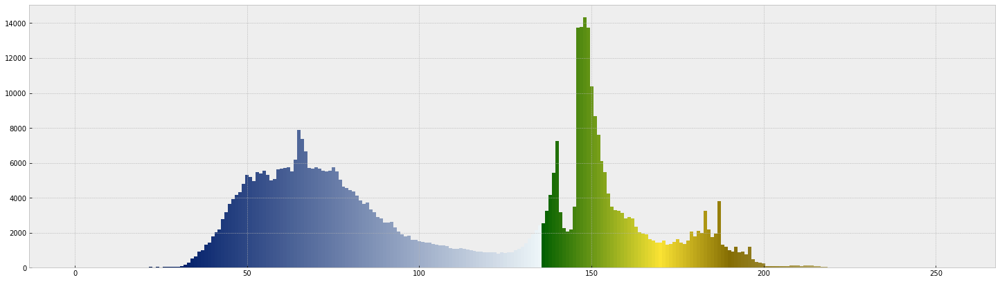

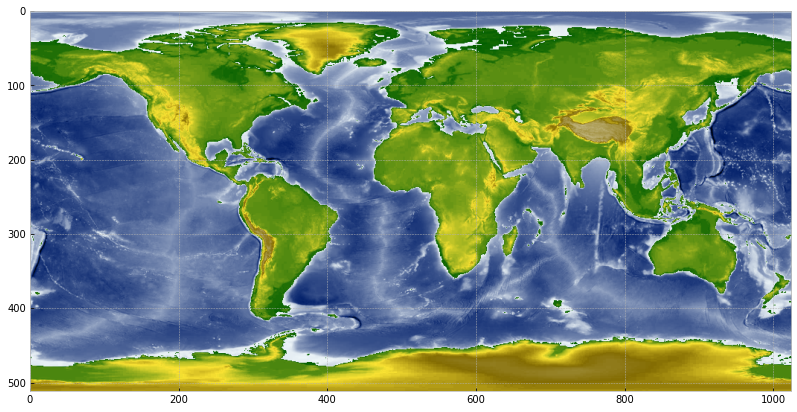

In [181]:
clist = [(0, "black"), (30/255., "#001E69"),(135/255., "#EDF5F8"),(136/255., "#036001"), 
         (170/255., "#FAE333") ,(190/255., "#846D03"), (255/255., "white")]
cmap = mcolors.LinearSegmentedColormap.from_list("", clist)

img = Image.open("earth.jpg")
img = ImageOps.grayscale(img)
ratio = img.size[0]/img.size[1]
img = img.resize((1024,int(1024/ratio)))
img = np.asarray(img)
bin_counts, bin_edges = np.histogram(img, bins=255, range=(0,255))
df = pd.DataFrame(bin_counts,index=bin_edges[0:-1],columns=["value"])
plt.figure(figsize=(25,7))
plt.bar(x=df.index, height=df.value,width=1,color=cmap(df.index/255.)) #calculating histogra.
plt.show()
plt.figure(figsize=(25,7))
plt.imshow(cmap(img))

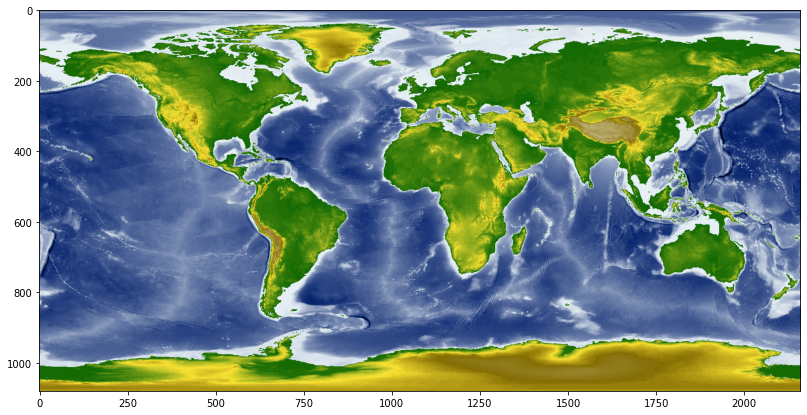

In [557]:
plt.figure(figsize=(25,7))
plt.imshow(cmap(img))

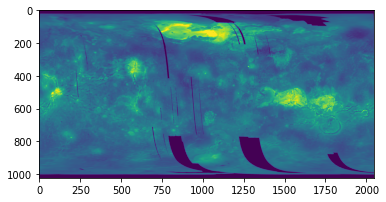

In [582]:
img = Image.open("venus.jpg")
img = img.resize((int(img.size[0]/4),int(img.size[1]/4)))
img = np.asarray(img)
plt.imshow(img)

In [569]:
bin_counts, bin_edges = np.histogram(img, bins=255, range=(0,255))
df = pd.DataFrame(bin_counts,index=bin_edges[0:-1],columns=["value"])
df

,value
0.0,2706211
1.0,31540
2.0,16540
3.0,12458
4.0,9606
...,...
250.0,2011
251.0,1984
252.0,1919
253.0,2315


<BarContainer object of 255 artists>

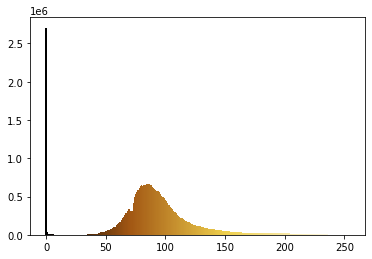

In [596]:
clist = [(0, "black"),  (70/255, "#A15613"), (150/255, "#EECF4C"), (255/255, "white")]

cmap = mcolors.LinearSegmentedColormap.from_list("", clist)
#cmap = mcolors.LinearSegmentedColormap.from_list("", cvalues.to_numpy()/255.)

plt.bar(x=df.index, height=df.value,width=1,color=cmap(df.index/255.)) #calculating histogra.

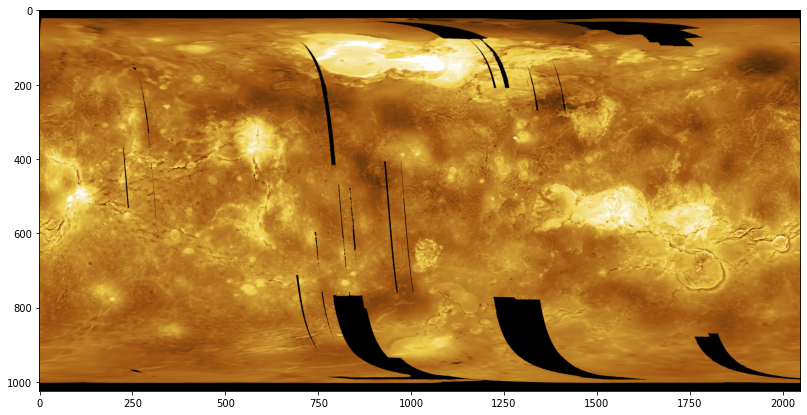

In [597]:
plt.figure(figsize=(25,7))
plt.imshow(cmap(img))

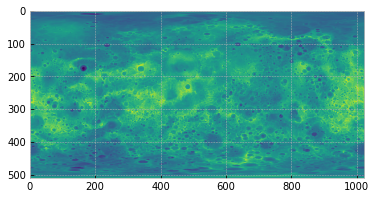

In [140]:
img = Image.open("mercury.jpg")
#img = img.resize((int(img.size[0]/4),int(img.size[1]/4)))
img = ImageOps.grayscale(img)
img = np.asarray(img)
plt.imshow(img)

In [141]:
bin_counts, bin_edges = np.histogram(img, bins=255, range=(0,255))
df = pd.DataFrame(bin_counts,index=bin_edges[0:-1],columns=["value"])
df

,value
0.0,17
1.0,9
2.0,4
3.0,8
4.0,5
...,...
250.0,10
251.0,6
252.0,2
253.0,4


<BarContainer object of 255 artists>

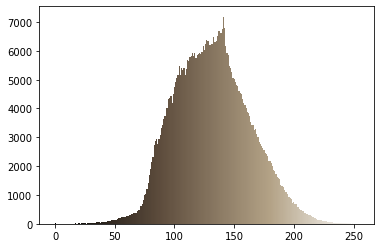

In [617]:
clist = [(0, "black"),  (90/255, "#5F4E3E"), (180/255, "#B3A286"), (255/255, "white")]

cmap = mcolors.LinearSegmentedColormap.from_list("", clist)
#cmap = mcolors.LinearSegmentedColormap.from_list("", cvalues.to_numpy()/255.)

plt.bar(x=df.index, height=df.value,width=1,color=cmap(df.index/255.)) #calculating histogra.

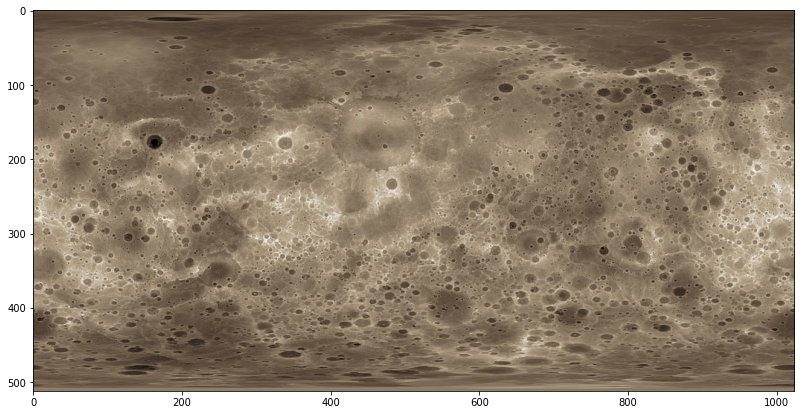

In [618]:
plt.figure(figsize=(25,7))
plt.imshow(cmap(img))

In [8]:
import numpy as np
np.transpose([list(range(3)), ["a","b","c"]])[0]

array(['0', 'a'], dtype='<U11')

In [11]:
test_files = ["a","b","c"]
np.transpose([list(range(len(test_files))), test_files])[0]

array(['0', 'a'], dtype='<U11')

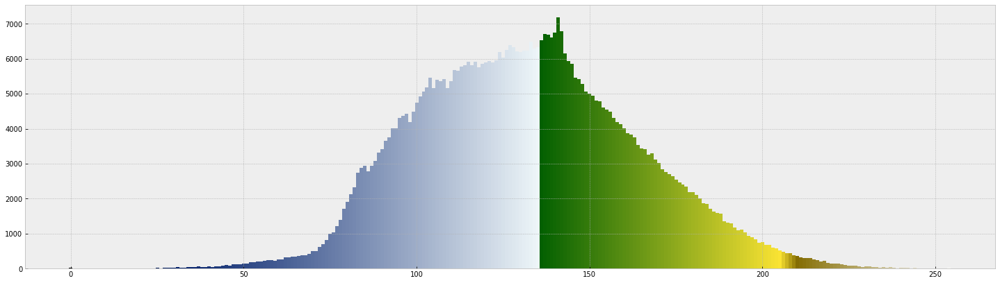

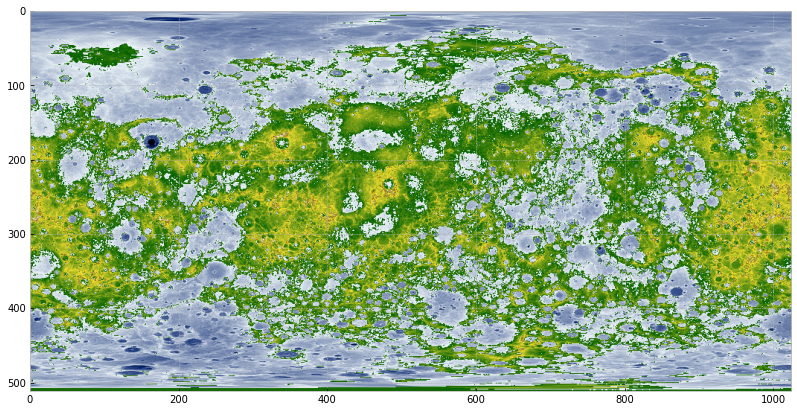

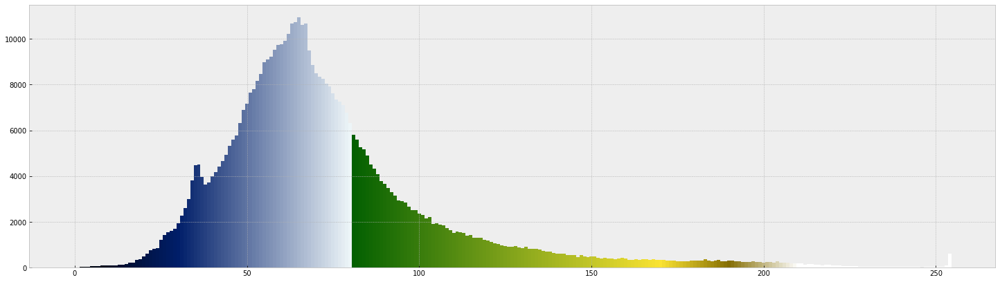

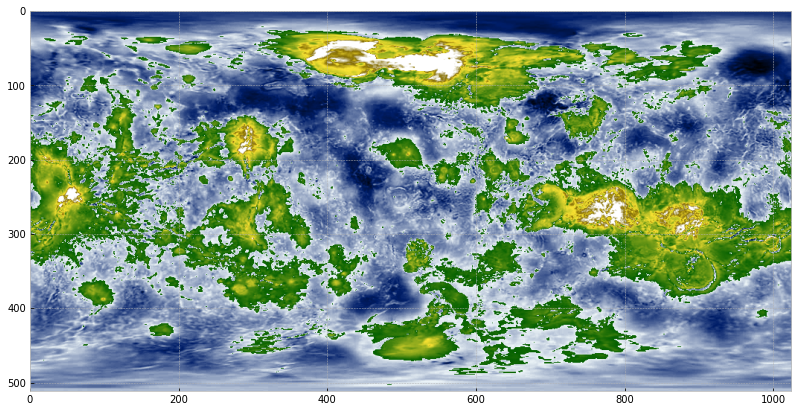

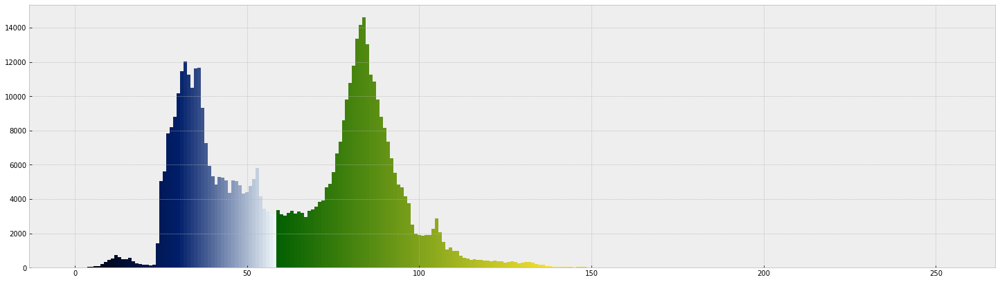

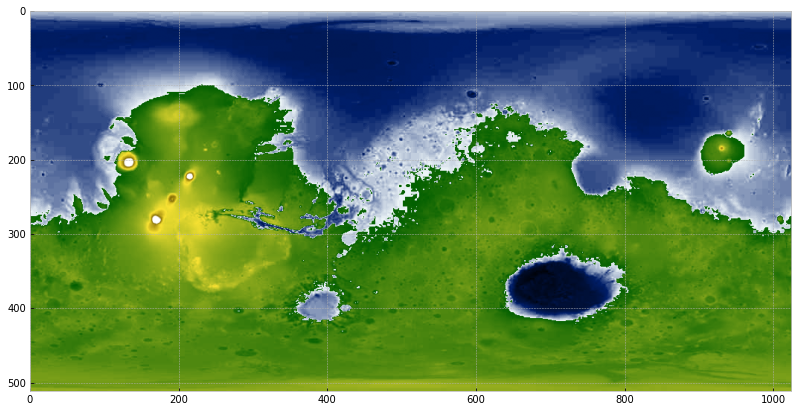

In [158]:
clist = [(0, "black"), (30/255., "#001E69"),(135/255., "#EDF5F8"),(136/255., "#036001"), 
         (205/255., "#FAE333") ,(210/255., "#846D03"), (255/255., "white")] # EARTH
cmap_me = mcolors.LinearSegmentedColormap.from_list("", clist)

clist = [(0, "black"), (30/255., "#001E69"),(80/255., "#EDF5F8"),(81/255., "#036001"), 
         (170/255., "#FAE333") ,(190/255., "#846D03"),(210/255., "white"), (255/255., "white")] # EARTH
cmap_v = mcolors.LinearSegmentedColormap.from_list("", clist)

clist = [(0, "black"), (30/255., "#001E69"),(58/255., "#EDF5F8"),(59/255., "#036001"), 
         (140/255., "#FAE333") ,(190/255., "#846D03"),(210/255., "white"), (255/255., "white")] # EARTH
cmap_ma = mcolors.LinearSegmentedColormap.from_list("", clist)

for path,cmap in zip(["mercury.jpg","venus3.png","mars.jpg"],[cmap_me,cmap_v,cmap_ma]):
    img = Image.open(path)
    img = ImageOps.grayscale(img)
    ratio = img.size[0]/img.size[1]
    img = img.resize((1024,int(1024/ratio)))
    img = np.asarray(img)
    bin_counts, bin_edges = np.histogram(img, bins=255, range=(0,255))
    df = pd.DataFrame(bin_counts,index=bin_edges[0:-1],columns=["value"])
    plt.figure(figsize=(25,7))
    plt.bar(x=df.index, height=df.value,width=1,color=cmap(df.index/255.)) #calculating histogra.
    plt.show()
    plt.figure(figsize=(25,7))
    plt.imshow(cmap(img))

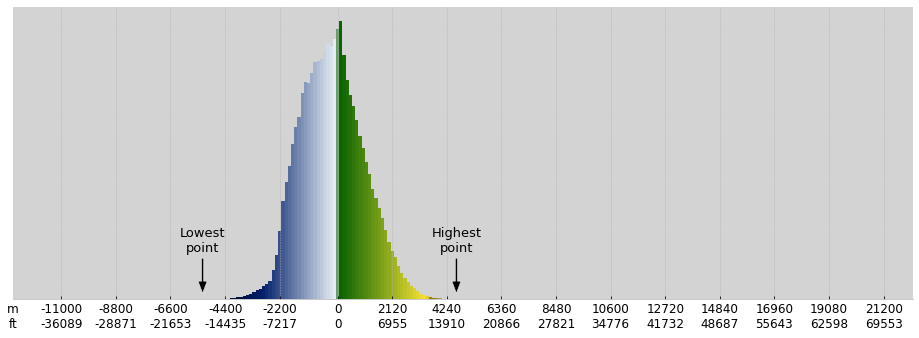

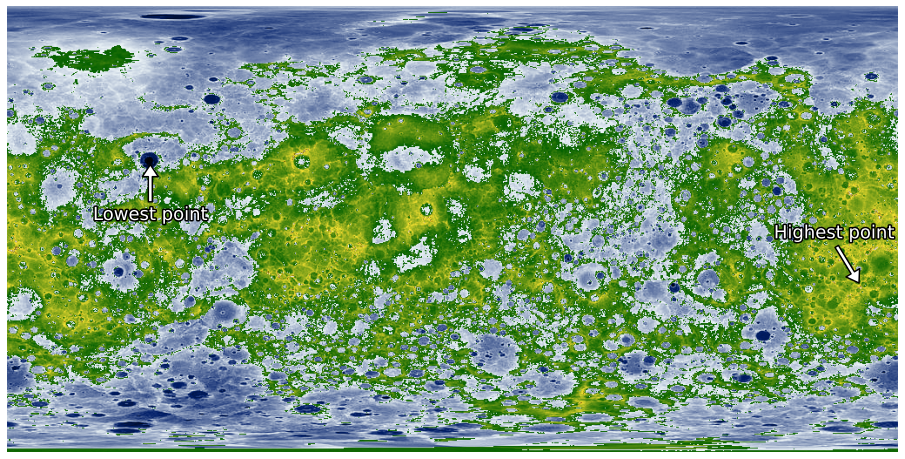

In [176]:
#plt.style.use('default')
plt.style.use('bmh')
clist = [(0, "black"), (60/255., "#001E69"),(135/255., "#EDF5F8"),(136/255., "#036001"), 
         (225/255., "#FAE333") ,(230/255., "#846D03"), (255/255., "white")] # EARTH
minmax_coords = [(164,179),(980,320)]
plot_hist_map("mercury.jpg", clist, 44, 123, minmax_coords)

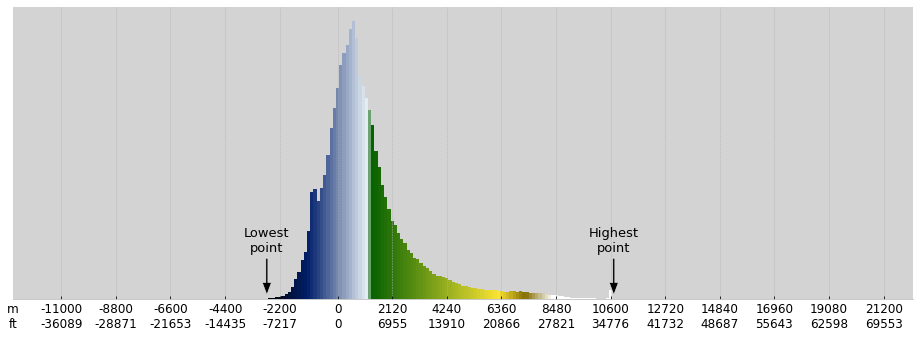

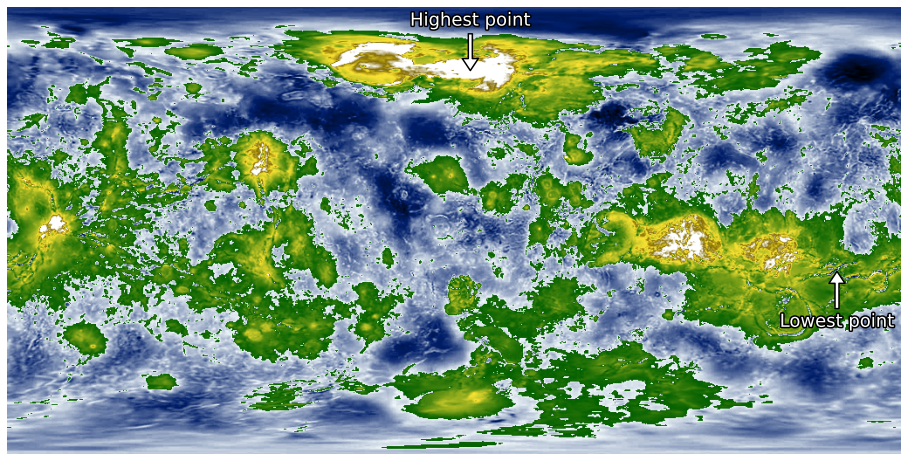

In [177]:
#plt.style.use('default')
plt.style.use('bmh')
clist = [(0, "black"), (30/255., "#001E69"),(75/255., "#EDF5F8"),(76/255., "#036001"), 
         (170/255., "#FAE333") ,(190/255., "#846D03"),(210/255., "white"), (255/255., "white")] # EARTH
minmax_coords = [(950,300),(530,75)]
plot_hist_map("venus3.png", clist, 64, 172, minmax_coords)

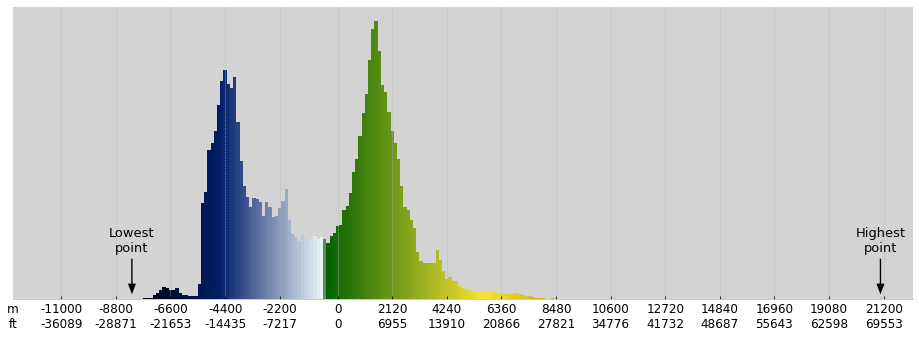

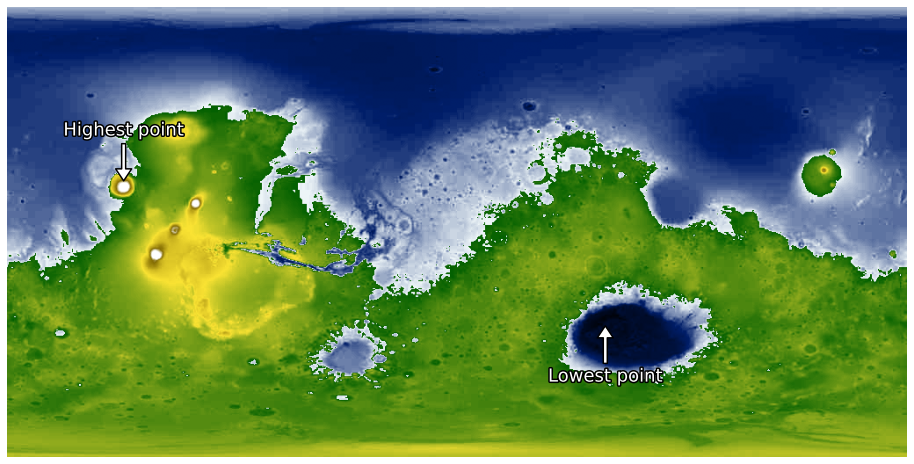

In [190]:
#plt.style.use('default')
clist = [(0, "black"), (30/255., "#001E69"),(58/255., "#EDF5F8"),(59/255., "#036001"), 
         (120/255., "#FAE333") ,(170/255., "#846D03"),(210/255., "white"), (255/255., "white")] # EARTH
minmax_coords = [(680,360),(132,200)]

plot_hist_map("mars.jpg", clist,22, 255,minmax_coords)

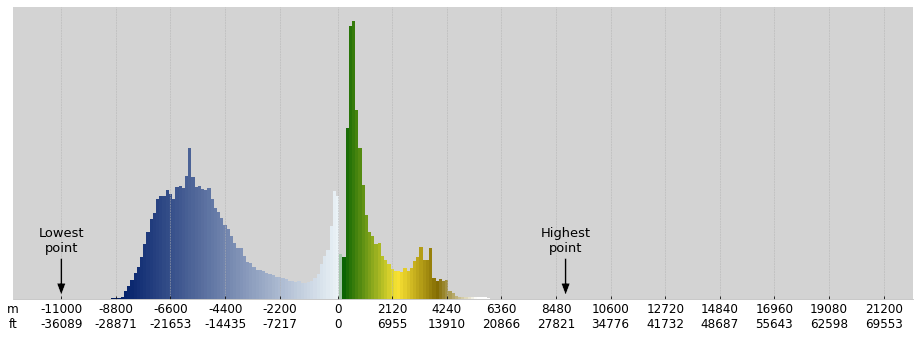

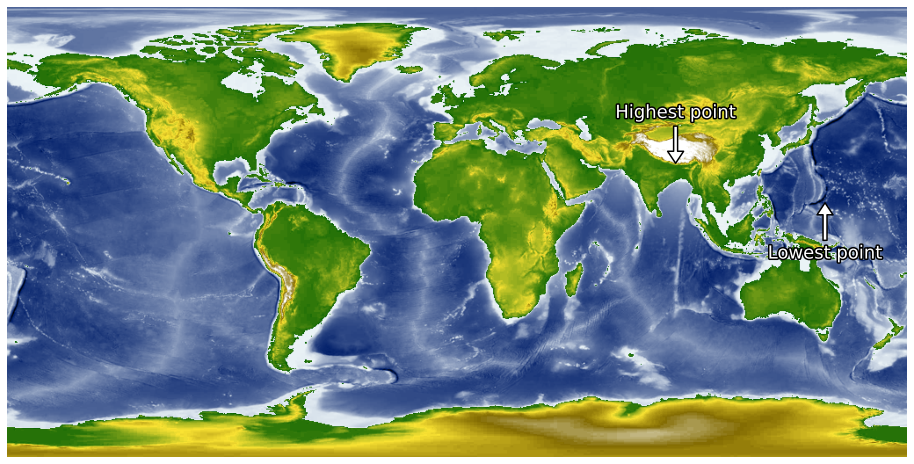

In [187]:
#plt.style.use('default')
clist = [(0, "black"), (30/255., "#001E69"),(141/255., "#EDF5F8"),(142/255., "#036001"), 
         (170/255., "#FAE333") ,(190/255., "#846D03"),(210/255., "white"), (255/255., "white")] # EARTH
minmax_coords = [(930,220),(760,180)]
plot_hist_map("earth.jpg", clist, 0, 157,minmax_coords,save=True)